# Análise Exploratória de Dados
Projeto do Módulo Técnicas de Programação 2 do programa DiversidadeTech
Integrantes:
- Jhaidan Ribeiro Cruz
- Paulo Henrique Rodrigues de Araujo
- Philipe Gomes
- Rodrigo Flávio dos Santos Pinheiro

 **OBJETIVO:**
 
 ***Avaliar o Racismo Estrutural através dos dados***

<center>
<img src="https://blogdaengenharia.com/wp-content/uploads/2020/09/Racismo-1.png" width="500" alt="cognitiveclass.ai logo"  /></center>

**Perguntas norteadoras durante a levantamento dos dados:**
- Ainda hoje existe **racismo**?
- O que os **dados da população** dizem a respeito?
- É **importante** falar sobre isso hoje?
- Por que o racismo é **estrutural**?

**Primeiros passos:**
- que **dados** queremos obter? (dados oficiais)
- como **obter** os dados? (fontes confiáveis - IBGE e IPEA)
- como **trabalhar** com esses dados (tabelas em excel)
- e por fim, **gerar** tabelas com métricas favoráveis às análises

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats


import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

pd.set_option("display.max_columns", None)

# Familiarização com o dataset

### Leitura do Dataframe

In [2]:
df = pd.read_excel('dados-desigualdade-racial-br-01.xlsx', engine='openpyxl')

In [3]:
df.head()

,ano,regiao,UF,etnia,%_etnia,%_desocupacao,%_subutilizacao,$_renda_med_formal,$_renda_med_informal,%_menor_renda_familiar,%_maior_renda_familiar,%_taxa_homicidio
0,2012,Sul,Paraná,Branca,70.093756,4.297697,11.976574,2689.194865,1807.224105,54.801209,86.986615,34.16
1,2012,Sul,Paraná,Preta,28.649748,6.569373,17.094560,1891.526311,1184.639805,43.630301,11.146214,24.27
2,2012,Sul,Rio Grande do Sul,Branca,83.394240,4.974190,12.692448,2750.546319,1684.144849,68.756637,94.296316,19.56
3,2012,Sul,Rio Grande do Sul,Preta,16.240863,7.264139,19.590148,1812.034808,1041.523339,30.793198,5.160456,28.50
4,2012,Sul,Santa Catarina,Branca,86.374041,3.035291,7.953827,2563.652586,1748.152744,73.921378,94.726731,11.29


### Informações / Interpretação das variáveis

ano: Categórica

regiao: Categórica

ufs: Categórica

etnia: Categórica

%_etnia: Numérica
- Porcentagem da população por Etnia na ufs.

%_desocupacao: Numérica
- Porcentagem de pessoas que possuem força de trabalho, mas que estão desempregadas (ou seja, que estão em busca de trabalho e podem trabalhar).

%_subutilizacao: Numérica
- Porcentagem de pessoas que trabalham em menor quantidade de tempo do que poderiam (ou seja, que não trabalham durante todo o tempo possível, mesmo tendo disponibilidade).

renda_med_formal: Numérica
- Rendimento médio real habitual do trabalho principal das pessoas de 14 anos ou mais de idade, ocupadas na semana de referência e em trabalhos formais (R$).

renda_med_formal: Numérica
- Rendimento médio real habitual do trabalho principal das pessoas de 14 anos ou mais de idade, ocupadas na semana de referência e em trabalhos informais (R$).

%_menor_renda_familiar: numérica
- Porcentagem das pessoas, líderes de família, por etnia, entre as famílias que possuem as 10% menores rendas.

%_maior_renda_familiar: numérica
- Porcentagem das pessoas, líderes de família, por etnia, entre as famílias que possuem as 10% maiores rendas.

%_taxa_homicidio: numérica
-  quantidade de homicídios classificados como dolosos (praticados voluntária ou intencionalmente, por qualquer instrumento ou meio) para cada 100 mil habitantes (ou seja, nº de homicios (branco/preto) * 100.000 / população).

# Processamento: Verificação de possíveis erros no dataframe
(Jhaidan)

In [5]:
df.shape

(378, 12)

In [4]:
df.isna().sum()

ano                       0
regiao                    0
UF                        0
etnia                     0
%_etnia                   0
%_desocupacao             0
%_subutilizacao           0
$_renda_med_formal        0
$_renda_med_informal      0
%_menor_renda_familiar    0
%_maior_renda_familiar    0
%_taxa_homicidio          0
dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378 entries, 0 to 377
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ano                     378 non-null    int64  
 1   regiao                  378 non-null    object 
 2   UF                      378 non-null    object 
 3   etnia                   378 non-null    object 
 4   %_etnia                 378 non-null    float64
 5   %_desocupacao           378 non-null    float64
 6   %_subutilizacao         378 non-null    float64
 7   $_renda_med_formal      378 non-null    float64
 8   $_renda_med_informal    378 non-null    float64
 9   %_menor_renda_familiar  378 non-null    float64
 10  %_maior_renda_familiar  378 non-null    float64
 11  %_taxa_homicidio        378 non-null    float64
dtypes: float64(8), int64(1), object(3)
memory usage: 35.6+ KB


Verificação de outliers (seaborn)

In [6]:
df_num = df.iloc[:,4:]

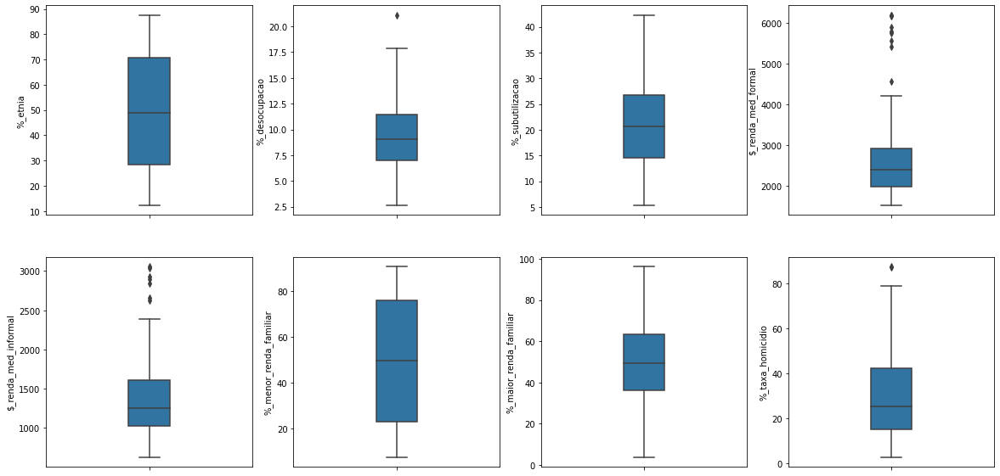

In [7]:
#matplotlib para gerar a estrutura da figura
fig, axes = plt.subplots(nrows = 2, ncols = int(df_num.shape[1]/2), 
figsize = (20,10))

column=0
row = 0
for col in df_num.columns:
  # seaborn para fazer os plots dentro de cada "ax" (em "axes")
  sns.boxplot(data = df_num, y=col, ax=axes[row,column],
  width = 0.2)
  if column < 3:
    column += 1
  else: 
    column = 0
    row += 1

Há outliers em 4 variaveis: %_desocupação, %_renda_med_formal, %renda_med_informal e %_taxa_homicidio

Usaremos, como critério para definição de outliers, pontos que, após normalização por z-score, ultrapassem o valor-limiar "3" (em valor absoluto).

<AxesSubplot: title={'center': 'Número de outliers por feature'}>

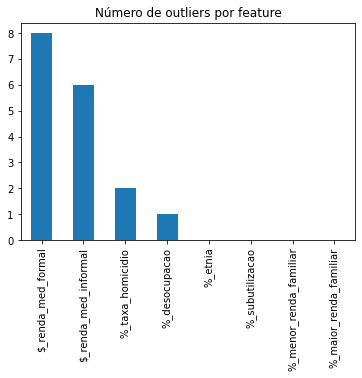

In [8]:
z_score_df = (np.abs(stats.zscore(df.iloc[:,4:])))
z_score_df[z_score_df >= 3].count().sort_values(ascending = False).plot(kind = 'bar', y = 'column',
title = 'Número de outliers por feature',
)

In [9]:
#remoção dos outliers
df = df[(np.abs(stats.zscore(df.iloc[:,4:])) < 3).all(axis=1)]


### Estatísticas Descritivas

In [10]:
df.iloc[:,4:].describe()

,%_etnia,%_desocupacao,%_subutilizacao,$_renda_med_formal,$_renda_med_informal,%_menor_renda_familiar,%_maior_renda_familiar,%_taxa_homicidio
count,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000
mean,49.661871,9.281918,21.074137,2478.978010,1305.630909,49.769801,49.141980,29.556267
std,23.204796,3.233798,7.759741,606.801521,395.389271,27.911183,20.291893,17.398870
min,12.182466,2.611288,5.264401,1511.264640,627.774332,7.562409,3.734457,2.840000
25%,27.879967,6.996321,14.675701,1967.324523,1006.201393,23.086295,35.888570,15.435000
50%,53.685991,8.957859,20.613470,2365.479786,1243.282191,50.840596,48.214949,25.660000
75%,71.110084,11.366608,26.755883,2891.124629,1581.872136,76.292664,62.762683,42.310000
max,87.650202,17.892882,42.319333,4562.893338,2624.195624,90.849003,96.265543,78.950000


O dataframe aparenta não ter valores incoerentes

# Visualização Univariada
(Philipe)

## Distribuição de todas as variáveis contínuas - Histograma
(seaborn)

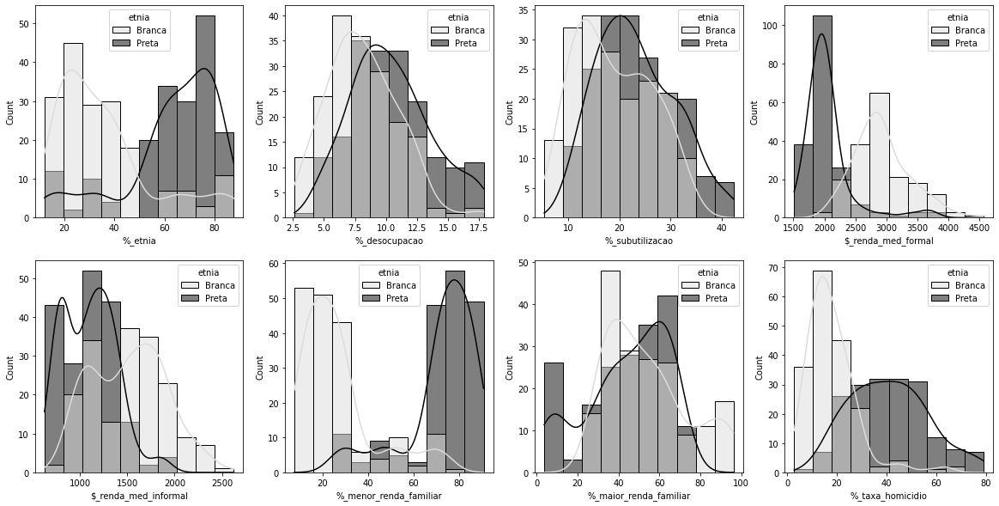

In [12]:
#matplotlib para gerar a estrutura da figura
fig, axes = plt.subplots(nrows = 2, ncols = 4 , figsize = (20,10))

column=0
row = 0
for col in df.columns[4:]:
  # seaborn para fazer os plots dentro de cada "ax" (em "axes")
  sns.histplot(data = df, x=col, ax=axes[row,column], 
  hue = 'etnia', kde = True,
  palette = {'Preta':'black', 'Branca':'gainsboro'}, 
  bins=10,
  #colors = ['gainsboro', 'dimgray']
  )

  if column < 3:
    column += 1
  else: 
    column = 0
    row += 1

Com os histogramas podemos visualizar as distribuições de cada variável. Percebe-se já em alguns casos a diferença por etnia.

## Distribuição e variação de todas as variáveis contínuas - Violin
(seaborn)

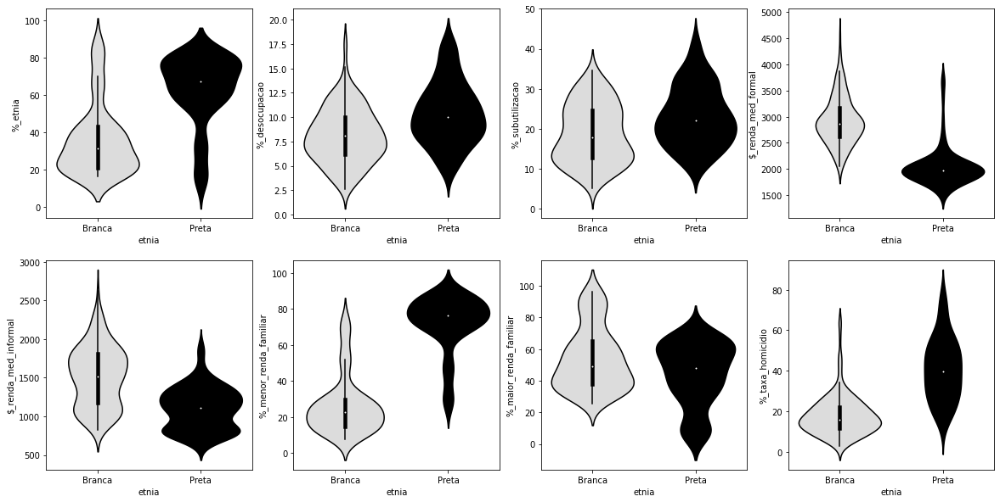

In [13]:
#matplotlib para gerar a estrutura da figura
fig, axes = plt.subplots(nrows = 2, ncols = 4 , figsize = (20,10))

column=0
row = 0
for col in df.columns[4:]:
  # seaborn para fazer os plots dentro de cada "ax" (em "axes")
  sns.violinplot(data = df, x = 'etnia', y=col, ax=axes[row,column], 
  #hue = 'etnia',
  palette = {'Preta':'black', 'Branca':'gainsboro'},
  #colors = ['gainsboro', 'dimgray']
  )

  if column < 3:
    column += 1
  else: 
    column = 0
    row += 1

O Violin traz uma visualização da distribuição e a variação juntos. Percebe-se a diferença de distribuição, entre etnias, para as porcentagens de renda média informal e formal. Percebe-se também pequenas diferenças de variação, entre etnias, para as taxas de desocupação, subutilização e homicídio. Para o caso das porcentagens de rendas entre as 10% maiores e menores rendas, percebe-se uma certa simetria na variação entre as etnias.

# Visualização Bivariada
(Jhaidan)

#### PairPlot entre todas as variáveis (seaborn)

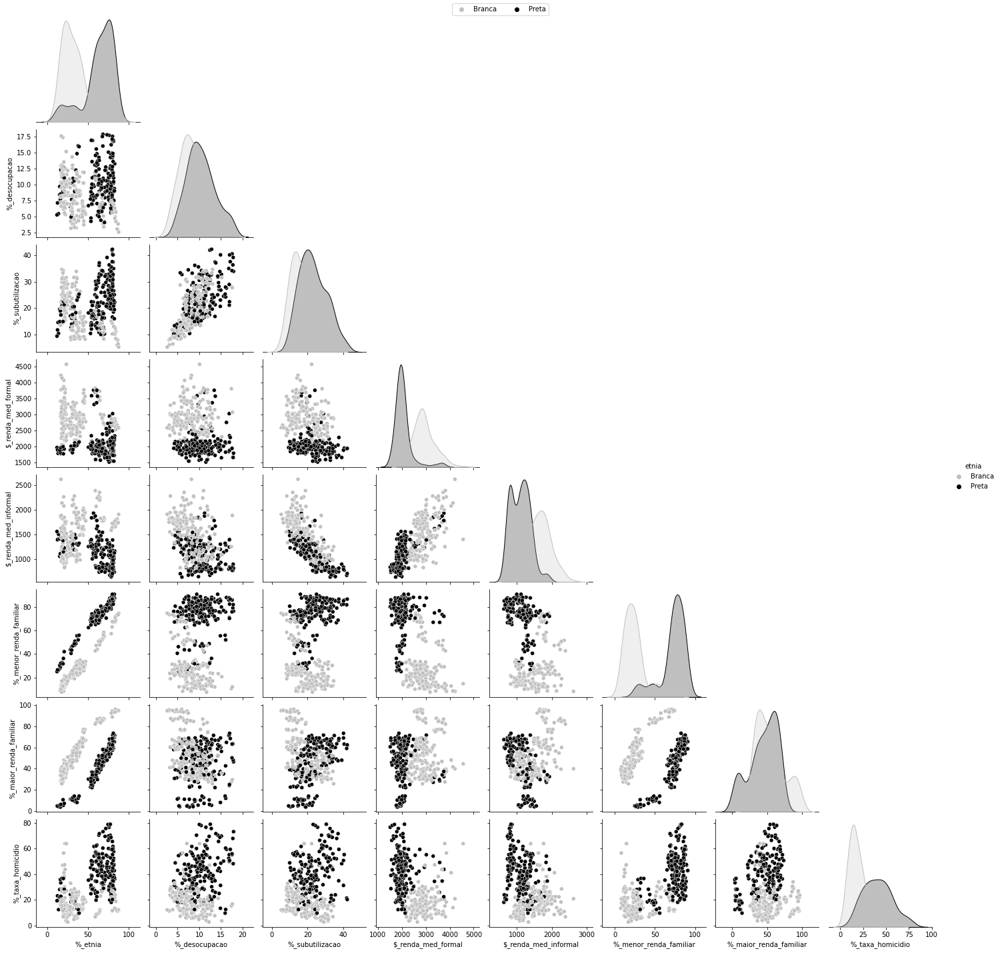

In [14]:
g = sns.pairplot(df, hue="etnia",\
             vars=df.iloc[:,4:],\
             palette = {'Preta':'black', 'Branca':'silver'},
            corner = True)

handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=3)

Nas dispersões do pairplot podemos perceber diferenças entre etnias em certos pares.

#### Correlação entre todas as variáveis

##### Matriz de correlação (plotly)<br>
Para todo o dataframe

In [15]:
#apenas numericas
df_num=df.iloc[:,4:]
#criando mascara
mask = np.zeros_like(df_num.corr(), dtype = bool)
mask[np.triu_indices_from(mask)] = True
corr = df_num.corr().mask(mask)

In [16]:
fig = px.imshow(round(corr,2),
         text_auto = True,
         template = 'simple_white',
         title = 'Correlação Entre as Variáveis',
         color_continuous_scale = 'blues',
         labels = {'color': 'Correlação'},
         )
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title_x = 0.5,
    font_size=12,
    title_font_size=18,
    width=850,
    height=650
)

##### Para etnia branca

In [34]:
dfb = df[df['etnia'] == 'Branca'].iloc[:,4:]
mask = np.zeros_like(dfb.corr(), dtype = bool)
mask[np.triu_indices_from(mask)] = True
corr = dfb.corr().mask(mask)

In [35]:
fig = px.imshow(round(corr,2),
         text_auto = True,
         template = 'simple_white',
         title = 'Correlação Entre as Variáveis - Etnia Branca',
         color_continuous_scale = 'YlOrBr',
         labels = {'color': 'Correlação'},
        )
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title_x = 0.5,
    font_size=12,
    title_font_size=18,
    width=850,
    height=650
)

##### Para etnia preta

In [36]:
dfp = df[df['etnia'] == 'Preta'].iloc[:,4:]
mask = np.zeros_like(dfp.corr(), dtype = bool)
mask[np.triu_indices_from(mask)] = True
corr = dfp.corr().mask(mask)

In [37]:
fig = px.imshow(round(corr,2),
         text_auto = True,
         template = 'simple_white',
         title = 'Correlação Entre as Variáveis - Etnia Preta',
         color_continuous_scale = 'Greys',
         labels = {'color': 'Correlação'},
        )
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title_x = 0.5,
    font_size=12,
    title_font_size=18,
    width=850,
    height=650
)

Correlação entre subutilização e renda média informal:
- Negativa e um pouco maior para pessoas pretas.
- Se aumenta a subutilização, diminui a renda informal um pouco mais para pretos.

Correlação entre pessoas entre as 10% mais ricas e entre as 10% mais pobres:
- Positiva para ambos e um pouco maior para pessoas brancas.
- Pode indicar a desigualdade.

Correlação entre subutilização e pessoas entre as 10% mais ricas:
- Positiva para Pretos, negativa para brancos

# Visualizações para análises gerais

## Séries
(matplotlib)<br>
(Paulo)

Taxa de Homicídio

Text(0.5, 0.98, 'Taxa de homicídio por Região')

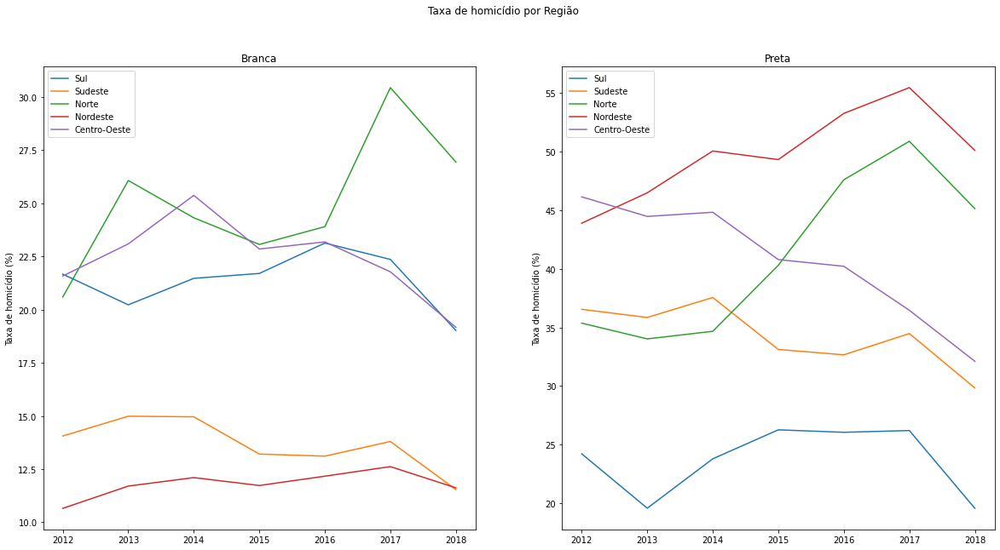

In [21]:
regioes = df['regiao'].unique()
etnias = df["etnia"].unique()

fig, (ax1, ax2) = plt.subplots(1,2,figsize = (20,10))

grouped_branca = df[df['etnia'] == 'Branca']\
    .groupby(["regiao", "ano"])\
    ['%_taxa_homicidio']\
    .mean()\
    .unstack("regiao")

grouped_preta = df[df['etnia'] == 'Preta']\
    .groupby(["regiao", "ano"])\
    ['%_taxa_homicidio']\
    .mean()\
    .unstack("regiao")

subplot_index = 1
datas = grouped_branca.index.to_list() # pegar as datas

for etnia in etnias:
    sub_ax = plt.subplot(1,2,subplot_index)
    subplot_index += 1
    
    for regiao in regioes:
        if etnia == 'Branca':
            y = grouped_branca[regiao]
            plt.plot(datas, y)
        else:
            y = grouped_preta[regiao]
            plt.plot(datas, y)
    plt.ylabel("Taxa de homicídio (%)")
    plt.title(etnia)
    plt.legend(regioes)

plt.suptitle('Taxa de homicídio por Região')

Desocupação

Text(0.5, 0.98, 'Desocupação por Regiões')

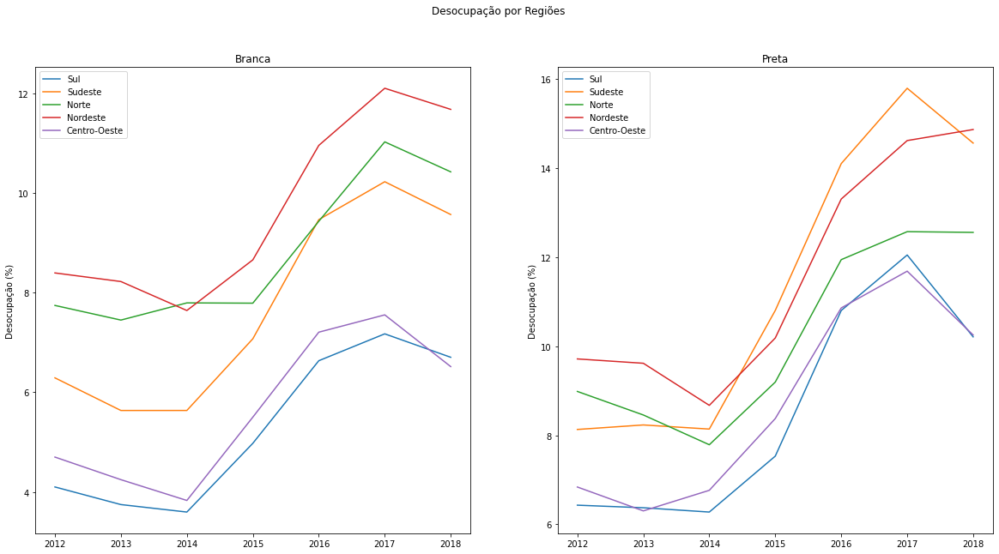

In [22]:
regioes = df['regiao'].unique()
etnias = df["etnia"].unique()

fig, (ax1, ax2) = plt.subplots(1,2,figsize = (20,10))

grouped_branca = df[df['etnia'] == 'Branca']\
    .groupby(["regiao", "ano"])\
    ['%_desocupacao']\
    .mean()\
    .unstack("regiao")

grouped_preta = df[df['etnia'] == 'Preta']\
    .groupby(["regiao", "ano"])\
    ['%_desocupacao']\
    .mean()\
    .unstack("regiao")

subplot_index = 1
datas = grouped_branca.index.to_list() # pegar as datas

for etnia in etnias:
    sub_ax = plt.subplot(1,2,subplot_index)
    subplot_index += 1
    
    for regiao in regioes:
        if etnia == 'Branca':
            y = grouped_branca[regiao]
            plt.plot(datas, y)
        else:
            y = grouped_preta[regiao]
            plt.plot(datas, y)
    plt.ylabel("Desocupação (%)")
    plt.title(etnia)
    plt.legend(regioes)

plt.suptitle('Desocupação por Regiões')

## Rendas médias formal e informal - Barras
(matplotlib)

In [23]:
grouped_dff = df.groupby(["regiao", "etnia"])\
    ['$_renda_med_formal']\
    .mean()\
    .unstack()

grouped_dfi = df.groupby(["regiao", "etnia"])\
    ['$_renda_med_informal']\
    .mean()\
    .unstack()

[Text(0, 3, '2456.23'),
 Text(0, 3, '1833.12'),
 Text(0, 3, '2185.27'),
 Text(0, 3, '1987.73'),
 Text(0, 3, '1891.39')]

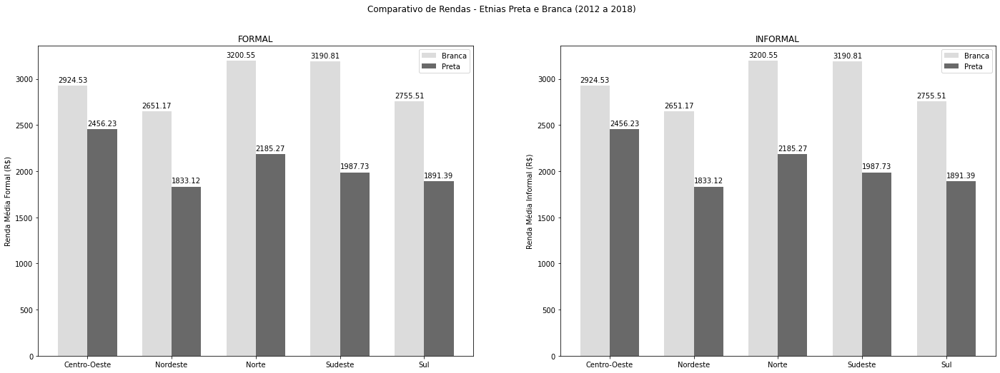

In [24]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (24,8))
plt.suptitle('Comparativo de Rendas - Etnias Preta e Branca (2012 a 2018)')
branca = grouped_dff['Branca']
preta = grouped_dff['Preta']
width = 0.35

#####
ufsf = grouped_dff.index.to_list()

xf = np.arange(len(ufsf))

rects1f = ax1.bar(xf - width/2, branca, width, label = 'Branca', color='gainsboro')
rects2f = ax1.bar(xf + width/2, preta, width, label = 'Preta', color = 'dimgray')

ax1.set_ylabel("Renda Média Formal (R$)")
ax1.set_title('FORMAL')
ax1.set_xticks(xf, ufsf)
ax1.legend(loc = 'upper right')

ax1.bar_label(rects1f, padding = 3, fmt = '%.2f')
ax1.bar_label(rects2f, padding = 3, fmt = '%.2f')

#####
ufsi = grouped_dfi.index.to_list()

xi = np.arange(len(ufsi))

rects1i = ax2.bar(xi - width/2, branca, width, label = 'Branca', color='gainsboro')
rects2i = ax2.bar(xi + width/2, preta, width, label = 'Preta', color = 'dimgray')

ax2.set_ylabel("Renda Média Informal (R$)")
ax2.set_title('INFORMAL')
ax2.set_xticks(xi, ufsi)
ax2.legend(loc = 'upper right')

ax2.bar_label(rects1i, padding = 3, fmt = '%.2f')
ax2.bar_label(rects2i, padding = 3, fmt = '%.2f')

## Rendas entre os 10% maiores e menores - Setores
(pandas)<br>
(Philipe)

Rendas familiares entre os 10% maiores e menores<br> (Num total de pessoas apenas pretas e brancas, sem considerar demais etnias)

C:\Users\jhaid\AppData\Local\Temp\ipykernel_17388\3361800247.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



array([<AxesSubplot: title={'center': '% das pessoas líderes de família entre as 10% menores rendas'}, ylabel='%_menor_renda_familiar'>,
       <AxesSubplot: title={'center': '% das pessoas líderes de família entre as 10% maiores rendas'}, ylabel='%_maior_renda_familiar'>],
      dtype=object)

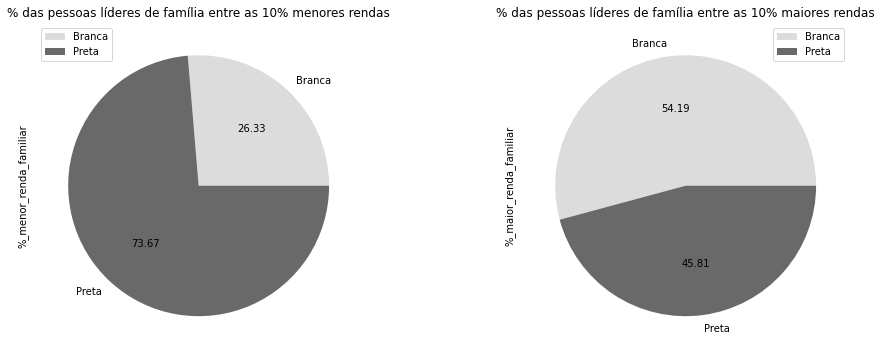

In [25]:
df.groupby("etnia")["%_menor_renda_familiar", "%_maior_renda_familiar"]\
    .sum().plot(kind='pie', subplots=True, figsize = (16,6),
    title = ['% das pessoas líderes de família entre as 10% menores rendas',\
        '% das pessoas líderes de família entre as 10% maiores rendas'],
        autopct='%.2f',
        colors = ['gainsboro', 'dimgray']
        )

População entre as etnias preta e branca (Num total de pessoas apenas pretas e brancas, sem considerar demais etnias)

<AxesSubplot: title={'center': '% da população entre as etnias preta e branca (no total de pretos e brancos)'}, ylabel='%_etnia'>

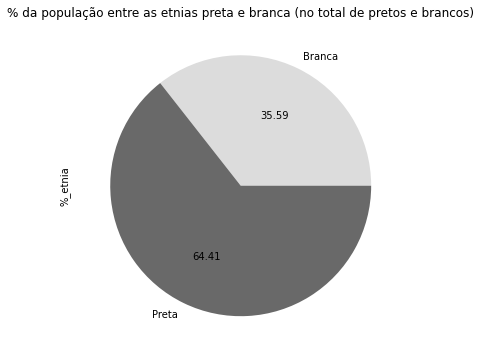

In [26]:
df.groupby("etnia")["%_etnia"]\
    .sum().plot(kind='pie', figsize = (16,6),
    title = '% da população entre as etnias preta e branca (no total de pretos e brancos)',
        autopct='%.2f',
        colors = ['gainsboro', 'dimgray']
        )

# Algumas visualizações interessante para finalizar
(Rodrigo)



In [27]:
def comparando_indice_a_taxa_homicidio(coluna):   

    x = df['etnia'].tolist()
    y = df[coluna].tolist()
    colors = df[coluna].tolist()
    area = df['%_taxa_homicidio'].tolist()

    ax= plt.scatter(x, y, s=area, c=colors, alpha=0.4)
    
    plt.title(f"Relação de Índices x Taxa de Homicídio entre 2012 e 2018", size = 12)    
    plt.ylabel(coluna, size = 12)    
    plt.colorbar()
    plt.text(0, -1, 'Quanto maior o círculo, maior a Taxa de Homicidio')
    plt.figure(figsize=(20, 1))
    plt.show()

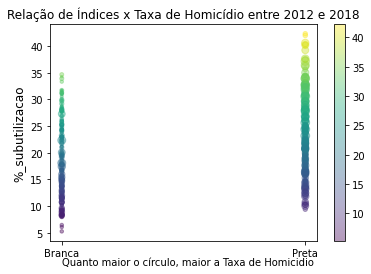

<Figure size 1440x72 with 0 Axes>

In [28]:
comparando_indice_a_taxa_homicidio('%_subutilizacao')

In [30]:
import json
from urllib.request import urlopen

with urlopen('https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson') as response:
 Brazil = json.load(response) # Javascrip object notation

state_id_map = {}
for feature in Brazil ['features']:
 feature['id'] = feature['properties']['name']
 state_id_map[feature['properties']['sigla']] = feature['id']

df_dados = pd.read_excel('dados-desigualdade-racial-br-02.xlsx', engine='openpyxl')

In [31]:
def plotar_map(coluna):
    fig = px.choropleth_mapbox(
     df_dados, 
     locations = 'UF', #define the limits on the map/geography
     geojson = Brazil, #shape information
     color = coluna, #defining the color of the scale through the database
     hover_name = 'UF', #the information in the box
     hover_data =['%_preta','%_branca',coluna],
     title = f'Mapa Anual - {coluna}', #title of the map
     mapbox_style = 'carto-positron', #defining a new map style 
     center={'lat':-14, 'lon': -55},#define the limits that will be plotted
     zoom = 2, #map view size
     opacity = 0.5, #opacity of the map color, to appear the background
     animation_frame = 'ano', #creating the application based on the year
     height= 600
    )
    fig.show()

In [32]:
df_dados.columns.tolist()

['ano',
 'regiao',
 'UF',
 '%_branca',
 '%_preta',
 '%_total_desocupacao',
 '%_branca_desocupacao',
 '%_preta_desocupacao',
 '%_total_subutilizacao',
 '%_branca_subutilizacao',
 '%_preta_subutilizacao',
 '$_renda_med_formal_total',
 '$_renda_med_formal_branca',
 '$_renda_med_formal_preta',
 '$_renda_med_informal_total',
 '$_renda_med_informal_branca',
 '$_renda_med_informal_preta',
 '%_menor_renda_familiar_branca',
 '%_menor_renda_familiar_preta',
 '%_maior_renda_familiar_branca',
 '%_maior_renda_familiar_preta',
 '%_taxa_homicidio_branca',
 '%_taxa_homicidio_preta']

In [33]:
plotar_map('%_taxa_homicidio_preta')

# Conclusões

**Perguntas norteadoras iniciais:**
- Ainda hoje existe **racismo**?
- O que os **dados da população** dizem a respeito?
- É **importante** falar sobre isso hoje?
- Por que o racismo é **estrutural**?

**SIM, ainda existe o RACISMO** 

Por mais que as leis garantam a igualdade entre os povos, o racismo é um processo histórico que modela a sociedade até hoje. Uma prova disso é o contraste explícito entre o perfil da população brasileira, **demonstrado durante a análise do dataset**, onde os piores índices para o desenvolvimento humano são predominantes na Etnia **PRETA/PARDA**.

A **importância** de análises e questionamentos sobre a temática **RACIAL** se torna cada vez mais necessária e urgente diante de tantos atos violêntos que se espalham aos quatro cantos do mundo e é apenas **discutindo**, **debatendo pontos de vista** e **levantando fatos**, que caminharemos rumo à democracia racial.

Por fim, tal análise tenta desvendar um pouco mais o **RACISMO ESTRUTURAL** no Brasil, onde ele representa um processo histórico em que condições de **desvantagens e privilégios** a determinados grupos étnico-raciais são reproduzidos nos âmbitos políticos, econômicos, culturais e até mesmo nas relações cotidianas.

**MUITO OBRIGADO!**